## 8.3 Exercise: Off lattice Monte Carlo of Hard Spheres

The Hard Sphere model is a paradigmatic model in Soft Matter (despite the naming would not suggest so). The interaction energy between two hard spheres is zero if the separation distance is larger than the diameter of the particle $\sigma$ and infinite otherwise. For simplicity set $\sigma=1$ as the unit of length In practice, in such a case one can simplify the Metropolis acceptance rule as follows:

1. reject every displacement that brings any two particles closer than $\sigma-$call it an $overlap.$ For conve-
nience, assign a very large energy to the configuration if an overlap is present, so that it can be plotted
more easily.

2. accept every displacement that keeps every pair of particles at a distance larger than $\sigma$ or that removes
$\operatorname{an}$overlap.

An acceptable state for a Hard Sphere system has zero energy and is homogeneously distributed in the simulation box. The first condition is easily checked; for the second, one can either look at the density along the different axis or at the radial distribution function.
For a system of $N=100$ particles:

 - Starting from random initial conditions (i.e. generate the initial coordinates at random) test the perfor mance of the code for different values of $d_max$ between $0.01\sigma$ and 1 $\sigma$ (consider at least 5 values) at different values of the number density $\rho=N/V=0.05,0.3,0.5,1.$ Perform an average over at least 10 realizations. Discuss what happens at the acceptance ratio and at the energy as a function of $d_{max}$ upon varying the density.

- Perform the same test, this time starting from a simple cubic crystal with a primitive cell of fixed length
$\sigma.$

| Parameter               | Value                                            |
| ----------------------- | ------------------------------------------------|
|σ * |1|
| $ \rho $           | 0.05, 0.3, 0.5, 1                                  |
| $ d_{\text{max}} $    | 0.01σ, 0.05σ, 0.1σ, 0.5σ, 1σ                    |
|  $N_{\text{Part}}$    |   100        |
| $N_{\text{realiz}}$  | 10|
| $N_{\text{sweeps}}$  | 6000|
| T | 2|
|dr ** | 0.01|

<br>* σ =spheres radius;
<br>** dr = radial distribution function bin width.


#### Notes on the implementation 

1) Particle position allocation is done using 2 siamese arrays: $X_{new}$ and $X$. <br> $X_{new}$ is used for proposing a new displacement of the choosen particle at a given timestep. If there are no overlapping and if the Metropolis test is true, then $X$ will take the values of $X_{new}$. If the test fails, on the other hand, the $X_{new}$ values will be restored to the pre-displacement values.<br>

```//  for the position (NPartx3) 
double **X = (double **)malloc(mySys.NPart * sizeof(double *));    	
for (int i = 0; i < mySys.NPart; i++){
        X[i] = (double *)malloc(3.0 * sizeof(double));
    }

    // copy of the position (for the proposed displacemnet)
double **X_new = (double **)malloc(mySys.NPart * sizeof(double *));    	
for (int i = 0; i < mySys.NPart; i++){
        X_new[i] = (double *)malloc(3.0 * sizeof(double));
    }
```        

2) The energy is computed using hard spheres potential and it is updated every time there is a displacement by only accounting for the difference of energy due to the displacement of that particle (see `energy.h` function).

3) The random initialization is done by starting from 1 particle and adding 1 single particle at one time, to be sure no overlap occours.

4) The simulation runs for $6000$ MC sweeps, meaning 1 min, which is relatively short time to obtain good results. The energy, acceptance rate and radial density of particles is averaged over 10 realizations. 

5) The positions of the particles are stored in a **file** just for the first realization. The file is organized as follows to simplify the ovito representation:

```
    filemc << mySys.NPart << endl; //  ovito format requirement
    filemc << endl;                //  ovito format requirement
    for (int n = 0; n < mySys.NPart; n++){
        filemc << "S" << n  << "\t" <<  X[n][0] << "\t" << X[n][1] << "\t" << X[n][2] << endl;
    }
```
Along the columns we have respectivly:
   - **col 1** particle identifier (S1,S2...);
   - **col 2** x coordinate of the position of the particle;
   - **col 3** y coordinate;
   - **col 4** z coordinate;

In the rows we have $N_{\text{sweeps}}$ - blocks of $N_{\text{Part}}$ lines each. Each block represent the position of all the particles in the box at a given time step $t$. Each block is followed by an empty line and it is preceeded by the number of particles. Summarizing, the file 'rho*_dmax*.txt' is organized as follows:

<img src="schema.png" alt="Alt text" width="300" height="300">




Names of the files containing the positions for every combination of $ d_{\text{max}} $  and $ \rho $:

| ρ \ dmax| 0.01σ    | 0.05σ    | 0.1σ    | 0.5σ    | 1σ      |
| ------------- | -------- | -------- | ------- | ------- | ------- |
| 0.05          | rho005_dmax001 | rho005_dmax005 | rho005_dmax01 | rho005_dmax05 | rho005_dmax1 |
| 0.3           | rho03_dmax001  | rho03_dmax005  | rho03_dmax01  | rho03_dmax05  | rho03_dmax1  |
| 0.5           | rho05_dmax001  | rho05_dmax005  | rho05_dmax01  | rho05_dmax05  | rho05_dmax1  |
| 1             | rho1_dmax001    | rho1_dmax005    | rho1_dmax01    | rho1_dmax05    | rho1_dmax1    |

Time of execution of the 10 realizations, 6000 MC sweeps (s):

| ρ \ dmax| 0.01σ    | 0.05σ    | 0.1σ    | 0.5σ    | 1σ      |
| ------------- | -------- | -------- | ------- | ------- | ------- |
| 0.05          | 75 | 74 | 102 | 75 | 74 |
| 0.3           | 75  | 74  | 97  | 68  | 67  |
| 0.5           | 77  | 73  | 70  | 66  | 66  |
| 1             | 77    | 71    | 69    | 63    | 62    |


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from IPython.display import display, Image
import os

In [3]:
N = 100
density = np.array([0.05,0.3,0.5,0.8])
V = N / density
print("To simulate with a density and 100 particles: ", density)
print("use a box of side of ", V ** (1/3))

To simulate with a density and 100 particles:  [0.05 0.3  0.5  0.8 ]
use a box of side of  [12.5992105   6.93361274  5.84803548  5.        ]


# Random initialization

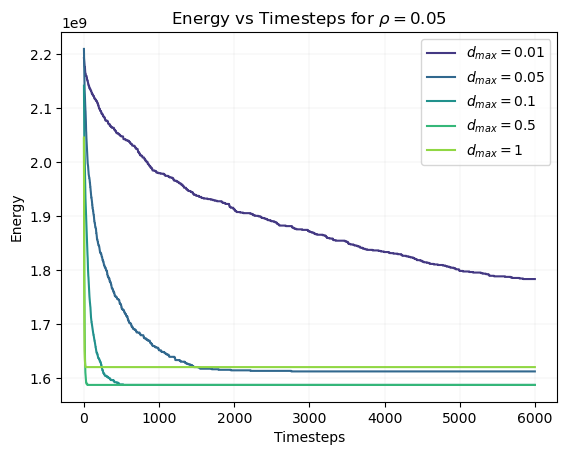

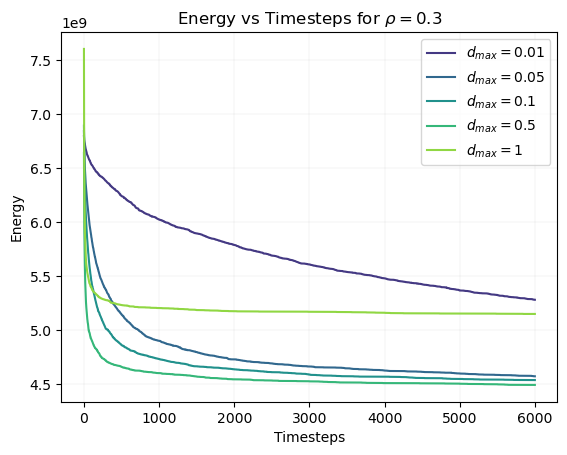

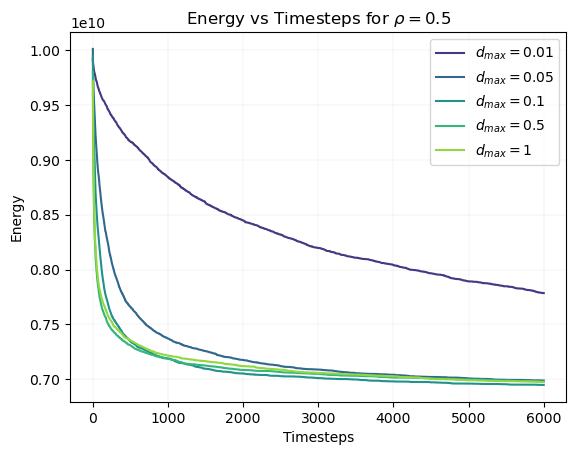

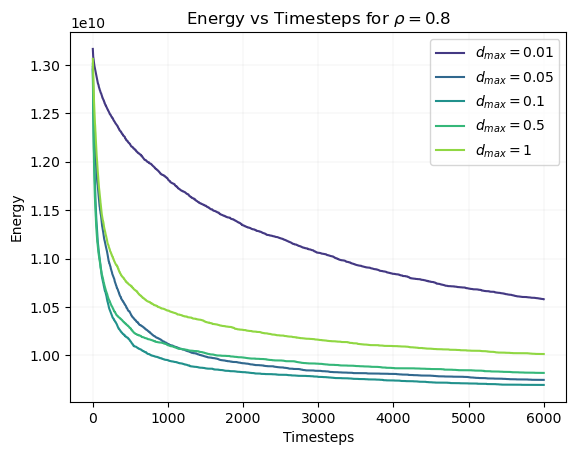

In [6]:
data_rho005 = ["005_dmax001", "005_dmax005", "005_dmax01", "005_dmax05", "005_dmax1"]
data_rho03 = ["03_dmax001", "03_dmax005", "03_dmax01", "03_dmax05", "03_dmax1"]
data_rho05 = ["05_dmax001", "05_dmax005", "05_dmax01", "05_dmax05", "05_dmax1"]
data_rho08 = ["08_dmax001", "08_dmax005", "08_dmax01", "08_dmax05", "08_dmax1"]

dmax = ["0.01","0.05","0.1","0.5","1" ]
rho = ["0.05","0.3","0.5","0.8"]

E_rho005 = ['E_rho' + item + '.txt' for item in data_rho005]
E_rho03 = ['E_rho' + item + '.txt' for item in data_rho03]
E_rho05 = ['E_rho' + item + '.txt' for item in data_rho05]
E_rho08 = ['E_rho' + item + '.txt' for item in data_rho08]

# Plotting
index = 0 
palette = sns.color_palette('viridis', len(dmax))
for file_paths in [E_rho005, E_rho03, E_rho05, E_rho08]:
    for i, file_path in enumerate(file_paths):
        data = np.loadtxt(os.path.join('random_init/', file_path))
        plt.plot(data, label=f'$d_{{max}}={dmax[i]}$', linewidth = 1.5,  color=palette[i])
    plt.title(f'Energy vs Timesteps for $\\rho={rho[index]}$')  
    index +=1
    plt.xlabel('Timesteps')
    plt.ylabel('Energy')   
    plt.legend()
    plt.grid(linewidth = 0.1)
    plt.show()

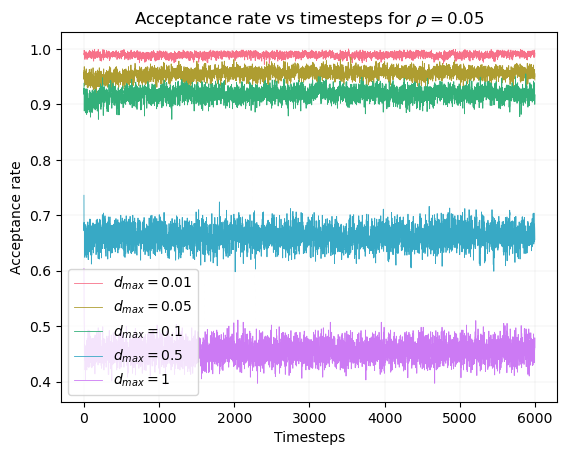

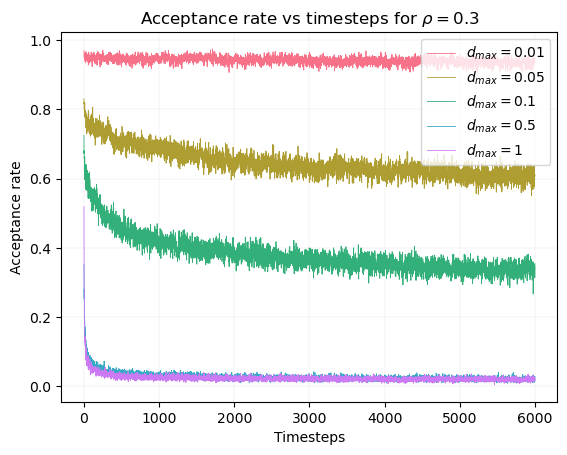

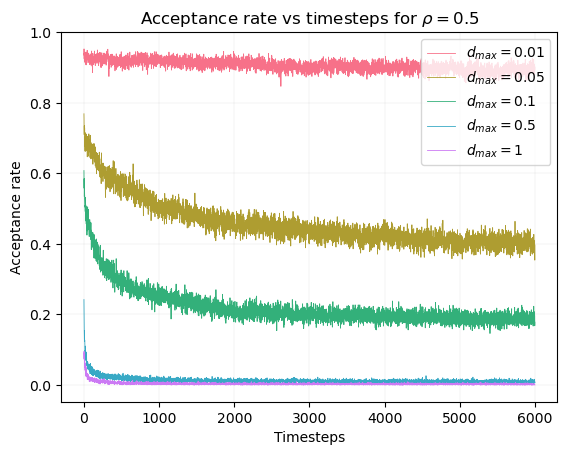

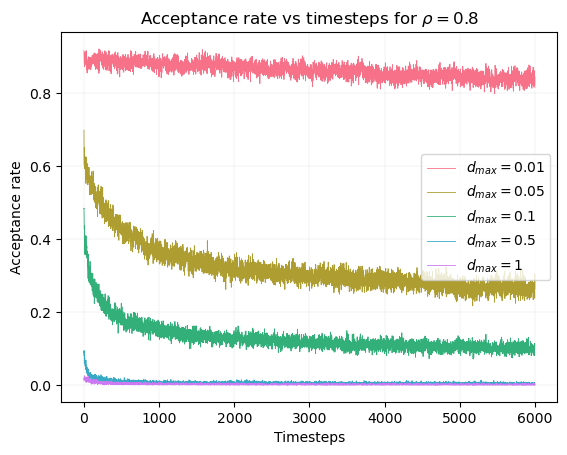

In [4]:
a_rho005 = ['a_rho' + item + '.txt' for item in data_rho005]
a_rho03 = ['a_rho' + item + '.txt' for item in data_rho03]
a_rho05 = ['a_rho' + item + '.txt' for item in data_rho05]
a_rho08 = ['a_rho' + item + '.txt' for item in data_rho08]

# Plotting
palette = sns.color_palette('husl', len(dmax))
index = 0
for file_paths in [a_rho005, a_rho03, a_rho05, a_rho08]:
    for i, file_path in enumerate(file_paths):
        data = np.loadtxt(os.path.join('random_init/', file_path))
        plt.plot(data, label=f'$d_{{max}}={dmax[i]}$', linewidth = 0.6, color=palette[i])
    
    plt.title(f'Acceptance rate vs timesteps for $\\rho={rho[index]}$')  
    index +=1
    plt.xlabel('Timesteps')
    plt.ylabel('Acceptance rate')
    plt.legend()
    plt.grid(linewidth = 0.1)
    plt.show()

In [74]:
def read_md_file(filename):
    with open(filename, 'r') as file:
        lines = file.readlines()

    data = {}
    i = 0
    while i < len(lines):
        # read particles number
        num_particles = int(lines[i].strip())
        i += 1

        # skip empty row
        i += 1

        # read particles positions
        particles = []
        for _ in range(num_particles):
            parts = lines[i].strip().split()
            particle_id = parts[0]
            x = float(parts[1])
            y = float(parts[2])
            z = float(parts[3])
            particles.append(np.array([x, y, z]))
            i += 1
        
        # add data to the dictionary
        timestamp = len(data)  # assume each block of data is a different timestamp
        data[timestamp] = particles

    return data

In [60]:
def compute_distances(data, L):
    return np.array([[np.sqrt(np.sum((p - q - np.round((p - q) / L) * L)**2))
                      for q in data]
                      for p in data])

def compute_radial_distribution(data, L=5):
    # Consider the final positions of the particles
    final_positions = data[999]

    # Calculate pairwise distances between particles
    distances = compute_distances(final_positions, L)
    
    # Initialize parameters
    num_particles = 100  # Number of particles considered
    density = num_particles / (L**3)  # Number density for a cubic box
    dr = 0.05  # Bin width for the radial distribution
    eps = 1e-9  # Small epsilon to avoid division by zero
    radii = np.arange(eps, L/2 + eps, dr)  # Max distance is half the box length due to PBC
    
    rdf_counts = np.zeros_like(radii)

    # Calculate RDF
    for i, r in enumerate(radii):
        # Count particles within the spherical shell of radius r and thickness dr
        shell_volume = (4/3) * np.pi * ((r + dr)**3 - r**3)
        counts = np.sum((distances > r) & (distances <= r + dr))
        rdf_counts[i] = counts / (num_particles * shell_volume * density)
    
    return rdf_counts


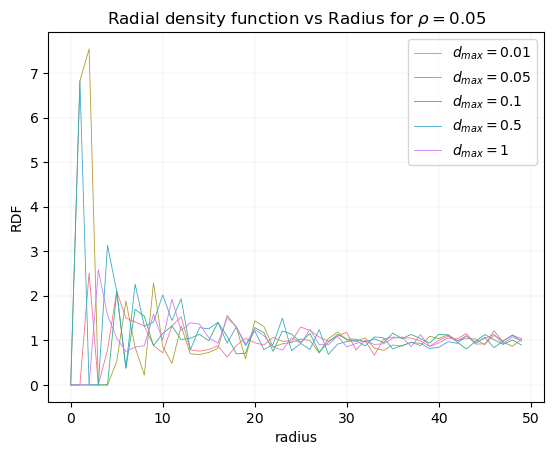

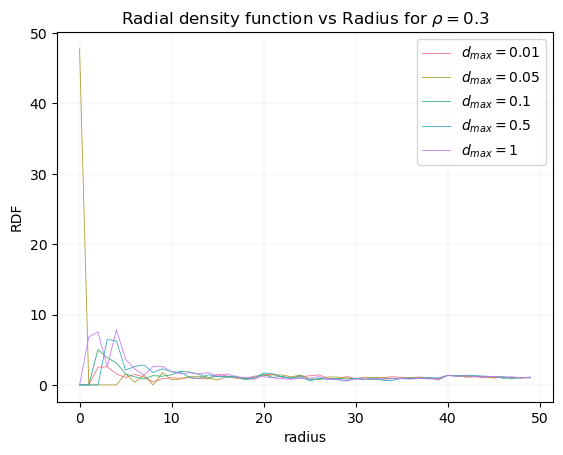

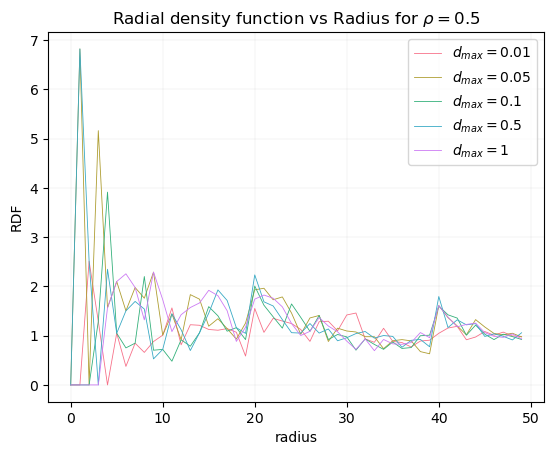

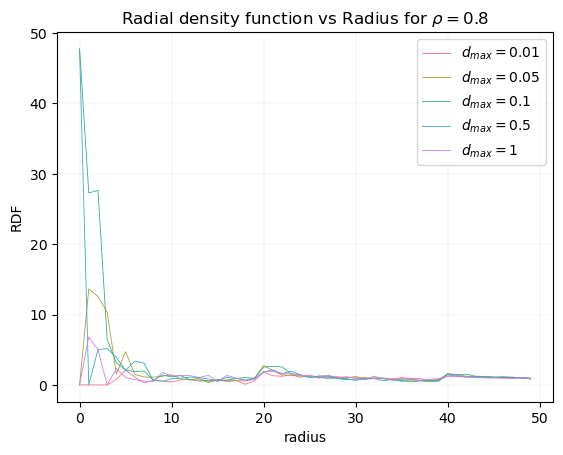

In [73]:
rho005 = ['rho' + item + '.txt' for item in data_rho005]
rho03 = ['rho' + item + '.txt' for item in data_rho03]
rho05 = ['rho' + item + '.txt' for item in data_rho05]
rho08 = ['rho' + item + '.txt' for item in data_rho08]

index = 0
palette = sns.color_palette('husl', len(dmax))

for file_paths in [rho005,rho03,rho05,rho08]:
    for i, file_path in enumerate(file_paths):
        data = read_md_file(os.path.join('random_init/', file_path))
        radial_distribution = compute_radial_distribution(data, L=5)
        plt.plot(radial_distribution,label=f'$d_{{max}}={dmax[i]}$', linewidth = 0.6, color=palette[i])
    plt.title(f'Radial density function vs Radius for $\\rho={rho[index]}$')  
    index +=1
    plt.xlabel('radius')
    plt.ylabel('RDF')
    plt.legend()
    plt.grid(linewidth = 0.1)
    plt.show()

Histogram and scatter plot (at final timestep) of the position of the particles for the simulation at low density $\rho = 0.05$ and $d_{max} = 1$:

<img src="random_init/hist_rho005_dmax1/rho005_dmax1_1.png" alt="Alt text" width="600" height="600">
<img src="random_init/hist_rho005_dmax1/rho005_dmax1_2.png" alt="Alt text" width="600" height="600">
<img src="random_init/hist_rho005_dmax1/rho005_dmax1_3.png" alt="Alt text" width="600" height="600">

<img src="random_init/hist_rho005_dmax1/rho005_dmax1_scatter.png" alt="Alt text" width="600" height="600">
<img src="random_init/hist_rho005_dmax1/rho005_dmax1_scatter2.png" alt="Alt text" width="600" height="600">

Histogram and scatter plot (at final timestep) of the position of the particles for the simulation at high density $\rho = 0.5$ and $d_{max} = 1$:

<img src="random_init/hist_rho05_dmax1/rho05_dmax1_1.png" alt="Alt text" width="600" height="600">
<img src="random_init/hist_rho05_dmax1/rho05_dmax1_2.png" alt="Alt text" width="600" height="600">
<img src="random_init/hist_rho05_dmax1/rho05_dmax1_3.png" alt="Alt text" width="600" height="600">

<img src="random_init/hist_rho05_dmax1/rho05_dmax1_scatter.png" alt="Alt text" width="600" height="600">
<img src="random_init/hist_rho05_dmax1/rho05_dmax1_scatter2.png" alt="Alt text" width="600" height="600">

First 100 steps, low density hard spheres


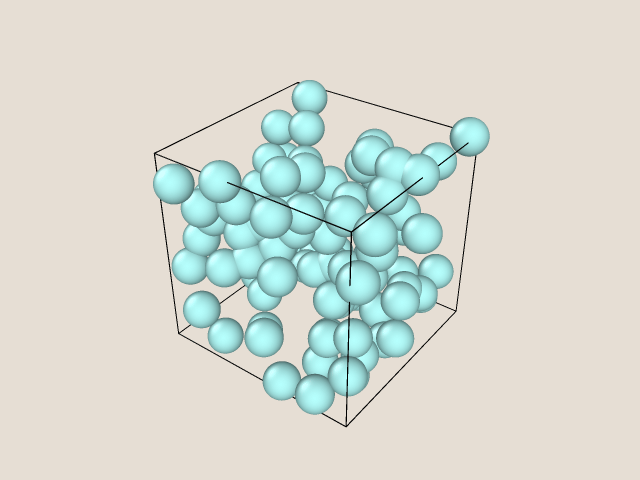

First 100 steps, medium density hard spheres (80%)


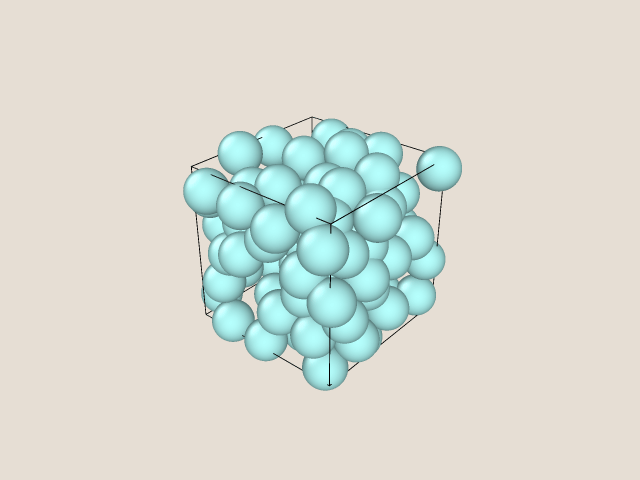

First 100 steps, high density hard spheres (50%)


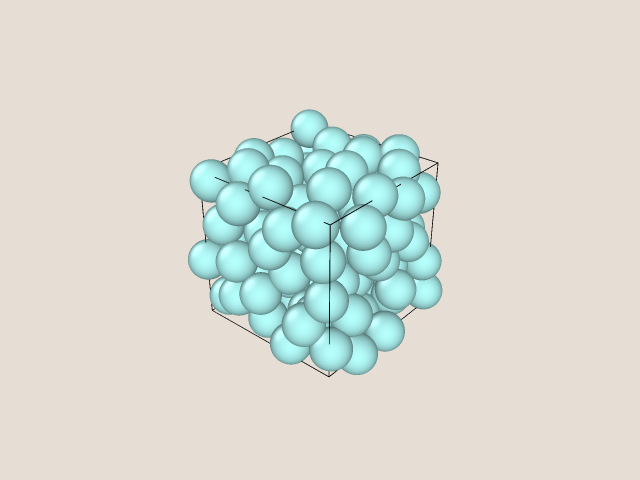

In [6]:
# Load and display the GIF
print("First 100 steps, low density hard spheres")
gif_path = "random_init/animation_005_05.gif"
display(Image(filename=gif_path))

print("First 100 steps, medium density hard spheres (80%)")
gif_path = "random_init/animation_05_05.gif"
display(Image(filename=gif_path))

print("First 100 steps, high density hard spheres (50%)")
gif_path = "random_init/animation_08_05.gif"
display(Image(filename=gif_path))


# Cubic cristal initialization 

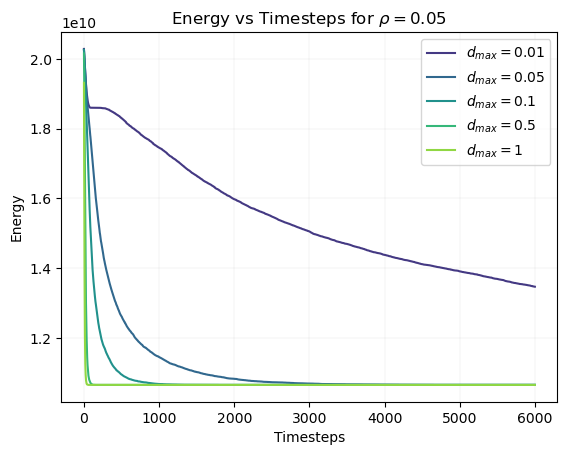

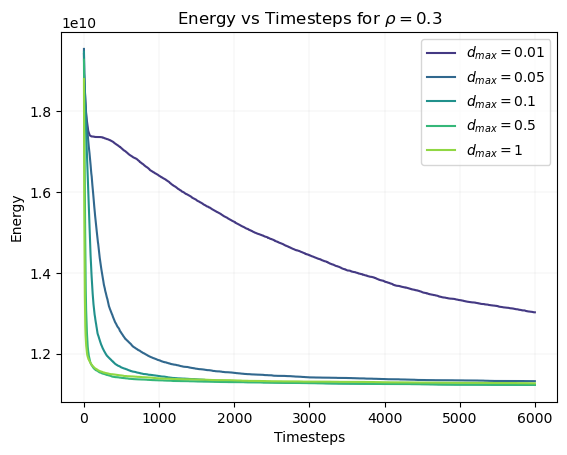

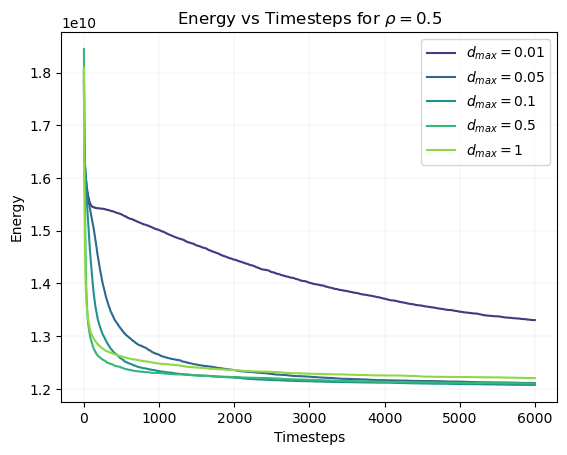

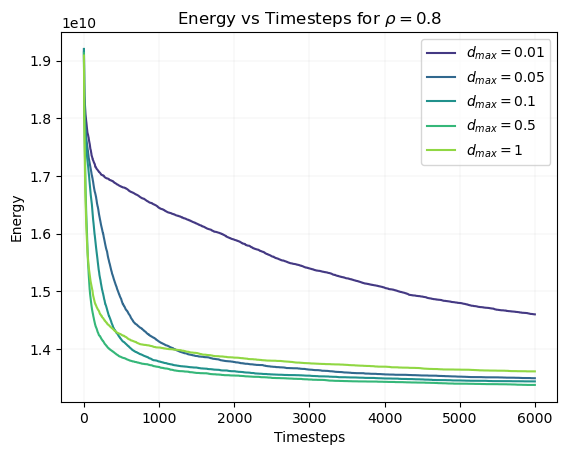

In [7]:
data_rho005 = ["005_dmax001", "005_dmax005", "005_dmax01", "005_dmax05", "005_dmax1"]
data_rho03 = ["03_dmax001", "03_dmax005", "03_dmax01", "03_dmax05", "03_dmax1"]
data_rho05 = ["05_dmax001", "05_dmax005", "05_dmax01", "05_dmax05", "05_dmax1"]
data_rho08 = ["08_dmax001", "08_dmax005", "08_dmax01", "08_dmax05", "08_dmax1"]

dmax = ["0.01","0.05","0.1","0.5","1" ]
rho = ["0.05","0.3","0.5","0.8"]

E_rho005 = ['C_E_rho' + item + '.txt' for item in data_rho005]
E_rho03 = ['C_E_rho' + item + '.txt' for item in data_rho03]
E_rho05 = ['C_E_rho' + item + '.txt' for item in data_rho05]
E_rho08 = ['C_E_rho' + item + '.txt' for item in data_rho08]

# Plotting
index = 0 
palette = sns.color_palette('viridis', len(dmax))
for file_paths in [E_rho005, E_rho03, E_rho05, E_rho08]:
    for i, file_path in enumerate(file_paths):
        data = np.loadtxt(os.path.join('', file_path))
        plt.plot(data, label=f'$d_{{max}}={dmax[i]}$', linewidth = 1.5,  color=palette[i])
    plt.title(f'Energy vs Timesteps for $\\rho={rho[index]}$')  
    index +=1
    plt.xlabel('Timesteps')
    plt.ylabel('Energy')   
    plt.legend()
    plt.grid(linewidth = 0.1)
    plt.show()

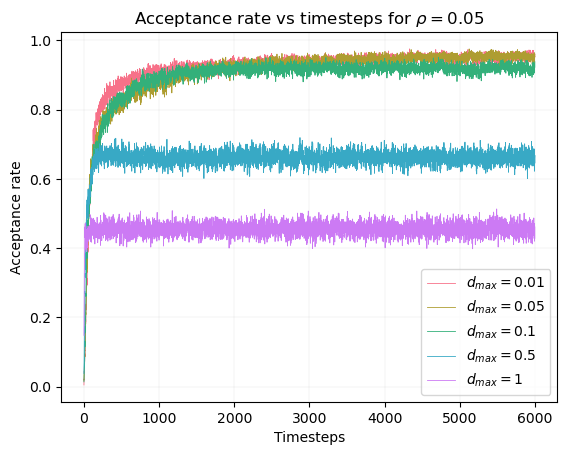

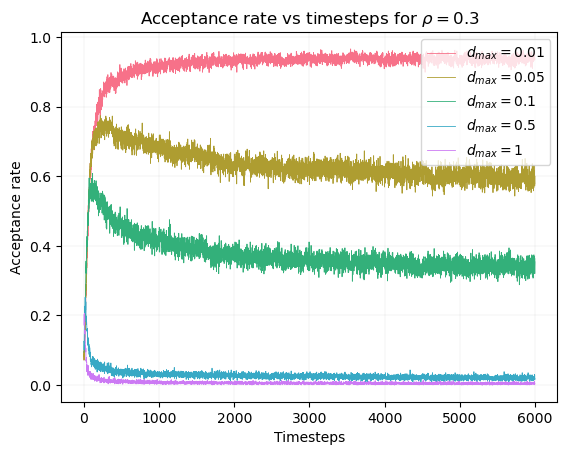

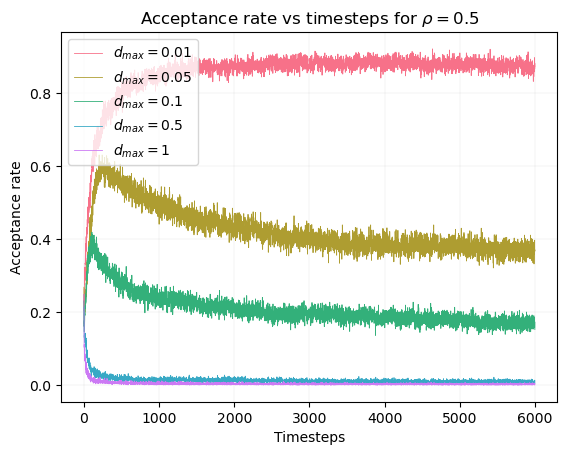

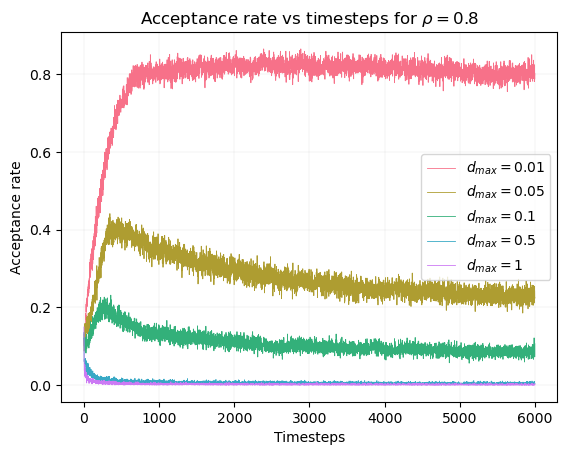

In [8]:
a_rho005 = ['C_a_rho' + item + '.txt' for item in data_rho005]
a_rho03 = ['C_a_rho' + item + '.txt' for item in data_rho03]
a_rho05 = ['C_a_rho' + item + '.txt' for item in data_rho05]
a_rho08 = ['C_a_rho' + item + '.txt' for item in data_rho08]

# Plotting
palette = sns.color_palette('husl', len(dmax))
index = 0
for file_paths in [a_rho005, a_rho03, a_rho05, a_rho08]:
    for i, file_path in enumerate(file_paths):
        data = np.loadtxt(os.path.join('', file_path))
        plt.plot(data, label=f'$d_{{max}}={dmax[i]}$', linewidth = 0.6, color=palette[i])
    
    plt.title(f'Acceptance rate vs timesteps for $\\rho={rho[index]}$')  
    index +=1
    plt.xlabel('Timesteps')
    plt.ylabel('Acceptance rate')
    plt.legend()
    plt.grid(linewidth = 0.1)
    plt.show()

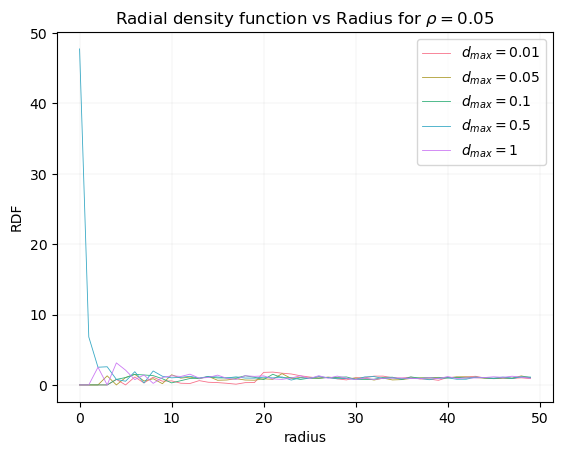

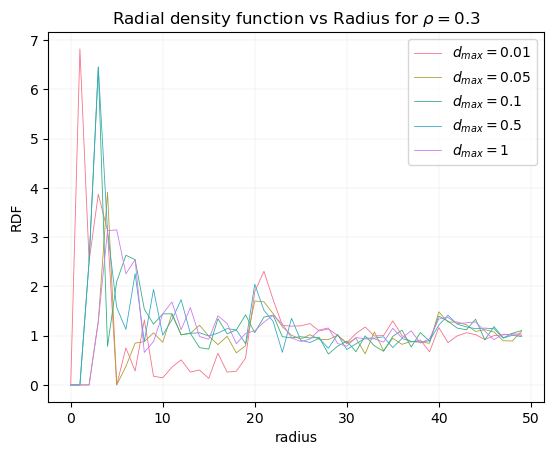

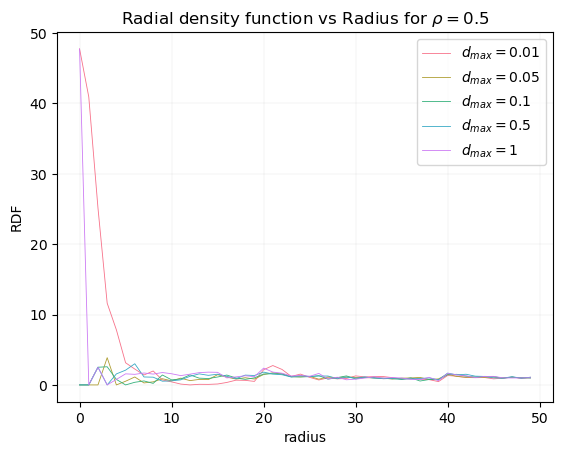

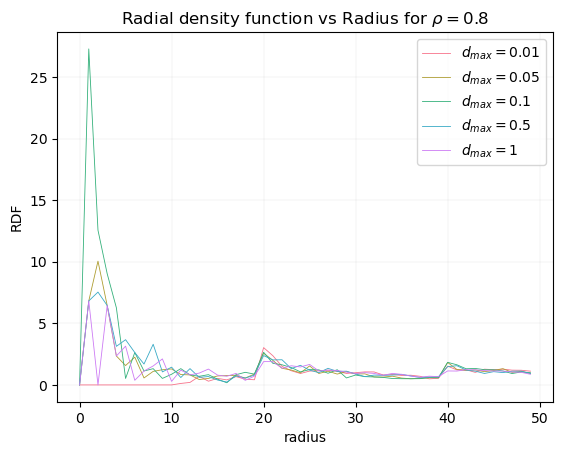

In [76]:
rho005 = ['C_rho' + item + '.txt' for item in data_rho005]
rho03 = ['C_rho' + item + '.txt' for item in data_rho03]
rho05 = ['C_rho' + item + '.txt' for item in data_rho05]
rho08 = ['C_rho' + item + '.txt' for item in data_rho08]

index = 0
palette = sns.color_palette('husl', len(dmax))

for file_paths in [rho005,rho03,rho05,rho08]:
    for i, file_path in enumerate(file_paths):
        data = read_md_file(os.path.join('', file_path))
        radial_distribution = compute_radial_distribution(data, L=5)
        plt.plot(radial_distribution,label=f'$d_{{max}}={dmax[i]}$', linewidth = 0.6, color=palette[i])
    plt.title(f'Radial density function vs Radius for $\\rho={rho[index]}$')  
    index +=1
    plt.xlabel('radius')
    plt.ylabel('RDF')
    plt.legend()
    plt.grid(linewidth = 0.1)
    plt.show()

First 100 steps, low density hard spheres


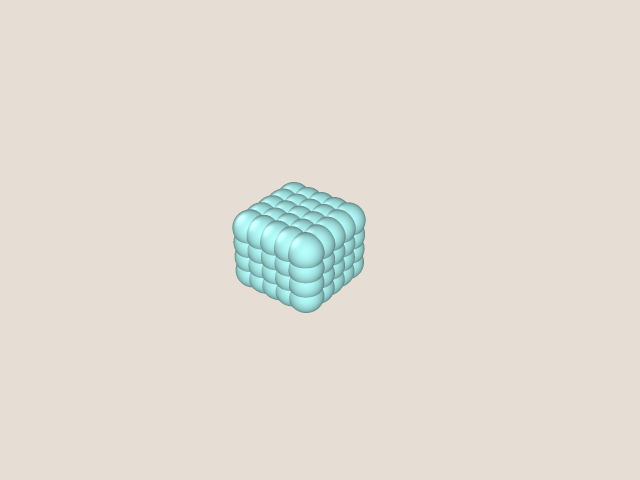

First 100 steps, medium density hard spheres


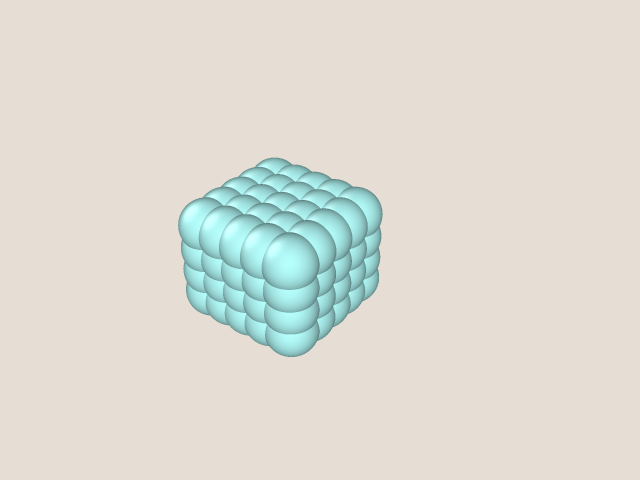

First 100 steps, high density hard spheres


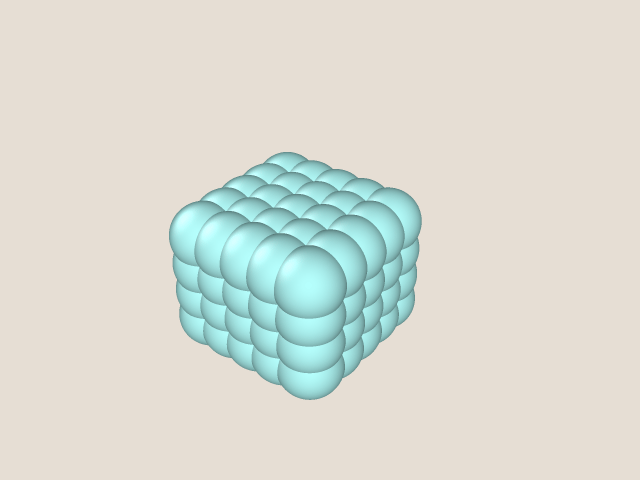

In [17]:
# Load and display the GIF
print("First 150 steps, low density hard spheres")
gif_path = "animation_C_005_1.gif"
display(Image(filename=gif_path))

print("First 150 steps, medium density hard spheres")
gif_path = "animation_C_03_1.gif"
display(Image(filename=gif_path))

print("First 150 steps, high density hard spheres")
gif_path = "animation_C_08_1.gif"
display(Image(filename=gif_path))


Scatter plot (at final timestep) of the position of the particles for the simulation at low density $\rho = 0.05$ and $d_{max} = 1$:

<img src="scatter_005_xz.png" alt="Alt text" width="600" height="600">
<img src="scatter_005_xy.png" alt="Alt text" width="600" height="600">


Scatter plot (at final timestep) of the position of the particles for the simulation at high density $\rho = 0.8$ and $d_{max} = 1$:

<img src="scatter_08_xz.png" alt="Alt text" width="600" height="600">
<img src="scatter_08_xy.png" alt="Alt text" width="600" height="600">
